In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/SkinCancerMNIST/SkinCancer_masks.npy')

In [3]:
images.shape

(12311, 512, 512, 1)

In [4]:
images.nbytes

12909019136

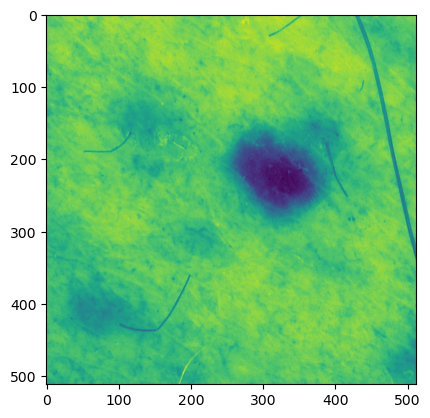

In [5]:
imshow(images[100])

In [6]:
masks.shape

(12311, 512, 512, 1)

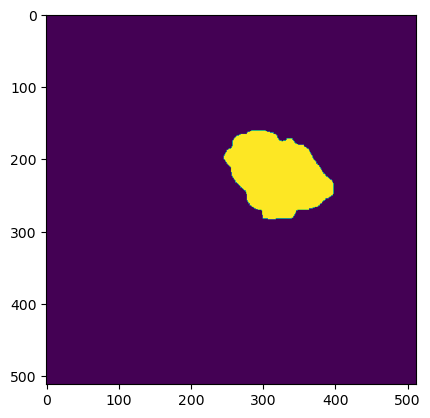

In [7]:
imshow(masks[100])

In [8]:
import sys
sys.path.append('../')
import gp2

In [9]:
from keras import losses

In [10]:
loss_fx = losses.BCE

In [11]:
C = gp2.KUC_UNet2D(loss=loss_fx)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmprd3h39vzkuc_unet2d


In [12]:
weights = {
    'A': 0.5,
    'A_train': 0.1,
    'A_val': 0.3,
    'A_test': 0.6,
    'B': 0.3,
    'B_train': 0.7,
    'B_val': 0.1,
    'B_test': 0.2,
    'Z': 0.2
}
PERCENT_TO_REPLACE = 30

In [13]:
from runner import Runner
R = Runner(verbose=True, workingdir=C.workingdir)

*** GP2 ***
Working directory: /tmp/tmprd3h39vzkuc_unet2d
Verbose mode active!


In [14]:
R.classifier = C ### use custom classifier

In [15]:
R.setup_data(images, masks, dataset_size=10000, weights=weights)


Weights OK!


In [16]:
R.run_classifier(batch_size=16)

Epoch 1/100
32/32 [==============================] - 37s 733ms/step - loss: 0.5489 - dice_coeff: 0.3039 - val_loss: 0.5212 - val_dice_coeff: 0.3125
Epoch 2/100
32/32 [==============================] - 15s 489ms/step - loss: 0.5002 - dice_coeff: 0.3425 - val_loss: 0.4578 - val_dice_coeff: 0.3929
Epoch 3/100
32/32 [==============================] - 16s 492ms/step - loss: 0.4528 - dice_coeff: 0.4134 - val_loss: 0.4342 - val_dice_coeff: 0.4609
Epoch 4/100
32/32 [==============================] - 15s 488ms/step - loss: 0.4170 - dice_coeff: 0.5025 - val_loss: 0.4376 - val_dice_coeff: 0.5289
Epoch 5/100
32/32 [==============================] - 15s 481ms/step - loss: 0.4112 - dice_coeff: 0.5312 - val_loss: 0.6665 - val_dice_coeff: 0.4328
Epoch 6/100
32/32 [==============================] - 15s 483ms/step - loss: 0.4592 - dice_coeff: 0.4720 - val_loss: 0.3997 - val_dice_coeff: 0.5556
Epoch 7/100
32/32 [==============================] - 15s 482ms/step - loss: 0.4098 - dice_coeff: 0.5299 - val_lo

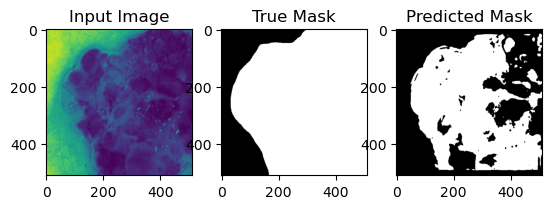

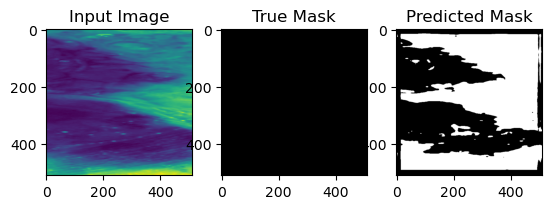

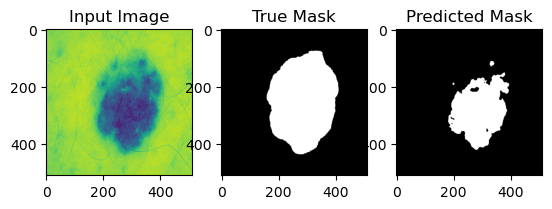

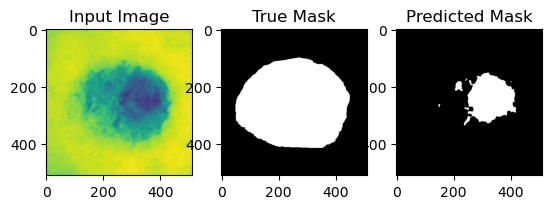

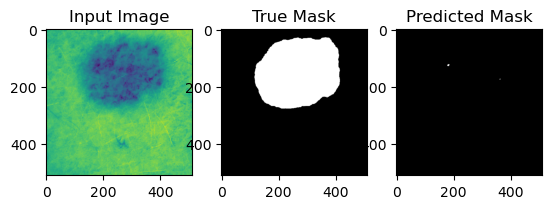

...

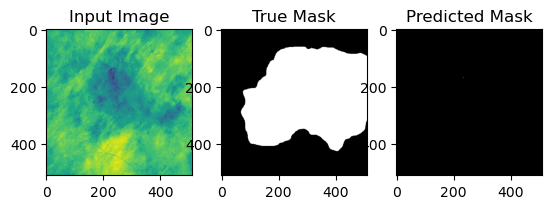

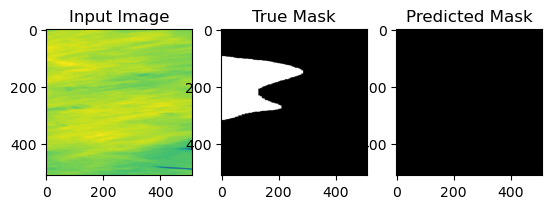

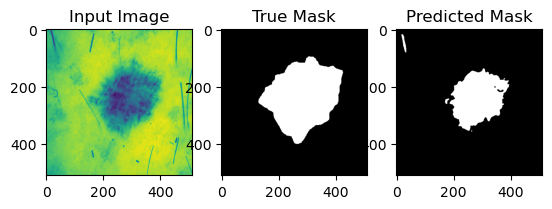

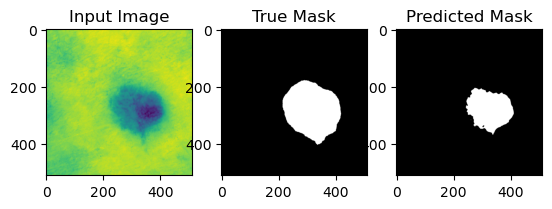

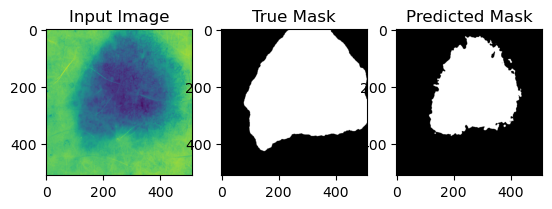

In [17]:
gp2.Util.visualize_predictions(C, images[1000:1500], masks[1000:1500], num_samples=200)